#**Código de ataques a CNN**

## **Nota**: En este Notebook se han implementado algunos algoritmos de ataque y se han almacenado sus resultados. Los comentarios sobre los mismos se han realizado en la memoria del TFG

### Carga del modelo

A continuación se detallan algunos de los algoritmos expuestos para ataques a redes neuronales predictivas. En específico, se aplican a redes neuronales convolucionales para la detección de señales de tráfico (red neuronal obtenida de [AridaneAM](https://github.com/AridaneAM/OpenCV-senales-de-trafico)) y datos obtenidos de [bitbucket](https://bitbucket.org/jadslim/german-traffic-signs/src/master/).

En primer lugar, es necesario cargar el modelo ya entrenado (todos los ataques aquí mostrados son exploratorios) y las imágenes que se van a usar en esta fase de test.

In [1]:
from google.colab import drive
drive.mount('/content/drive',force_remount=True)

Mounted at /content/drive


Con lo siguiente se obtienen las imágenes usando `get_image("Imagen")`

In [2]:
import os,sys
import cv2, numpy as np, math
from matplotlib import pyplot as plt

%cd '/content/drive/My Drive'
%pwd

%matplotlib inline
get_image = lambda route: os.path.join('/content/drive/My Drive/Colab Notebooks/TFG/CNN_senales_trafico/test', route)

/content/drive/My Drive


Ahora se carga el modelo almacenado en Drive.

In [3]:
import tensorflow as tf
from tensorflow.keras.models import load_model

model = load_model('/content/drive/My Drive/Colab Notebooks/TFG/CNN_senales_trafico/modelo_v3.h5')

Obsérvese que ha sido cargado correctamente.

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_1 (Conv2D)           (None, 28, 28, 60)        1560      
                                                                 
 conv2d_2 (Conv2D)           (None, 24, 24, 60)        90060     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 12, 12, 60)        0         
 g2D)                                                            
                                                                 
 conv2d_3 (Conv2D)           (None, 10, 10, 30)        16230     
                                                                 
 conv2d_4 (Conv2D)           (None, 8, 8, 30)          8130      
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 4, 4, 30)          0         
 g2D)                                                   

Obsérvese que es un modelo simple para detección de imágenes, por lo que en general no será muy difícil engañarlo si el ataque es bien dirigido.

### Lectura de imágenes

Tras haber obtenido todos los modelos necesarios, se hacen las predicciones oportunas para varias imágenes de test (previo preprocesado) y la lectura de las mismas, que serán las que se usarán en los ejemplos próximos.

In [4]:
cedaPaso = cv2.imread(get_image("1.jpg"),1)
maximo100 = cv2.imread(get_image("2.jpg"),1)
direc_prohibida = cv2.imread(get_image("4.jpg"),1)
maximo70 = cv2.imread(get_image("maximo70.png"),1)
maximo20 = cv2.imread(get_image("maximo20.jpg"),1)

Y para ver qué problema es tratado, se visualiza una imagen. Para ello, se hace uso de las siguientes funciones, obtenidas de las prácticas de la asignatura Visión por Computador, con pequeñas modificaciones para que se muestren los colores correspondientes.

In [5]:
# Normalización de la matriz que representa la imagen a [0,1]
def rangeDisplay01(im, flag_GLOBAL=True):
    # Convertir la matriz de la imagen a tipo float
    im = im.astype(float)

    if flag_GLOBAL:
        # Normalización global: escala todos los valores de la imagen
        # usando el mínimo y máximo global de toda la imagen
        im = (im - im.min()) / (im.max() - im.min())
    else:
        # Normalización por bandas: escala cada banda (canal) de la imagen
        # de manera independiente usando el mínimo y máximo de cada banda
        for band in range(im.shape[2]):
            im[:, :, band] = (im[:, :, band] - im[:, :, band].min()) / \
                             (im[:, :, band].max() - im[:, :, band].min())
            # Nota: recuerda que, para plt.imshow con datos RGB, el rango válido
            # es [0..1] para floats y [0..255] para enteros.

    # Devolver la imagen normalizada
    return im


# Función para mostrar una imagen 'im' con cierto título 'title'
def displayIm(im, title='Result', factor=2):
    # Primero normalizar el rango
    max_val = np.max(im)  # Encontrar el valor máximo en la imagen
    min_val = np.min(im)  # Encontrar el valor mínimo en la imagen

    # Verificar si la imagen necesita ser normalizada
    if min_val < 0 or max_val > 255:
        # Si los valores están fuera del rango [0, 255], normalizar a [0, 1]
        im = rangeDisplay01(im, flag_GLOBAL=True)

    # Comprobar si la imagen tiene 3 canales (es una imagen en color)
    if len(im.shape) == 3:
        # Convertir la imagen de BGR a RGB para su correcta visualización
        im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
        plt.imshow(im)  # Mostrar la imagen en color
    else:
        # La imagen tiene un solo canal (es una imagen en escala de grises)
        plt.imshow(im, cmap='gray')  # Mostrar la imagen en escala de grises

    # Ajustar el tamaño de la figura
    figure_size = plt.gcf().get_size_inches()  # Obtener el tamaño actual de la figura
    plt.gcf().set_size_inches(factor * figure_size)  # Ajustar el tamaño por el factor dado

    # Establecer el título de la figura
    plt.title(title)

    # Eliminar las marcas de los ejes
    plt.xticks([]), plt.yticks([])

    # Mostrar la figura
    plt.show()


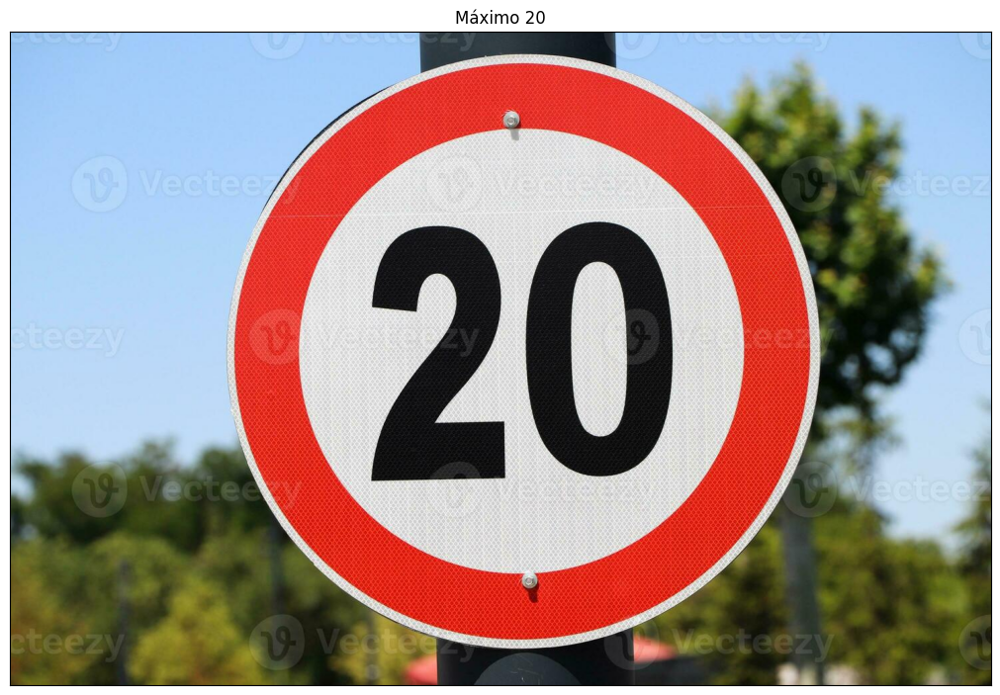

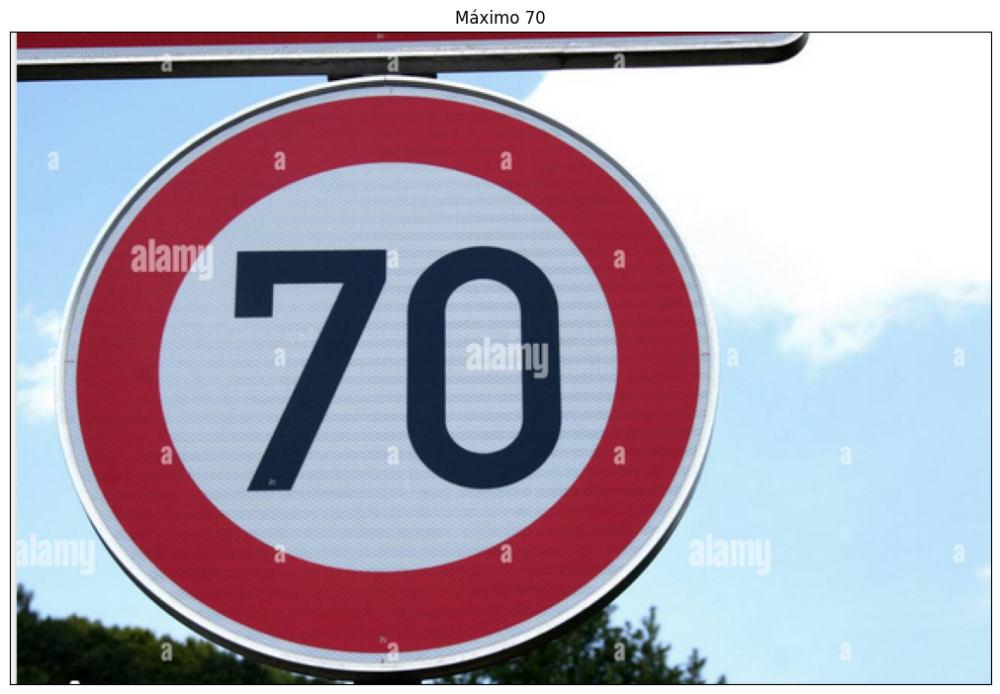

In [ ]:
displayIm(maximo20,'Máximo 20')
displayIm(maximo70,'Máximo 70')

Se está en condiciones de comenzar el preprocesado de las imágenes. Nótese que la red neuronal trabaja con imágenes en blanco y negro, por lo que para trabajar con ellas primero hay que leerlas a color (para los ataques) pero después, al hacer la predicción, hay que pasarlas a blanco y negro. Para obtener las imágenes en blanco y negro y preprocesar se usan las siguientes funciones, obtenidas del repositorio usado como referencia. Mismos comentarios con el tamaño: lo normal es que el ataque se haga indendientemente del tamaño de la imagen, por lo que se redimensionará la imagen a un tamaño aceptado por la red cuando se busque clasificar la imagen (adversaria o limpia).

In [6]:
# Convertir la imagen a escala de grises
def grayscale(image):
    # Convierte la imagen de BGR a escala de grises
    image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    return image

# Igualar el histograma de la imagen
def equalize(image):
    # Aplica la igualación de histograma a la imagen en escala de grises
    image = cv2.equalizeHist(image)
    return image

# Preprocesamiento de la imagen
def preprocessing(image):
    # Convierte la imagen a escala de grises
    image = grayscale(image)

    # Redimensiona la imagen a 32x32 píxeles
    # Esto es necesario para que la imagen tenga el tamaño esperado por el modelo de Keras
    image = cv2.resize(image, (32, 32))

    # Aplica la igualación de histograma
    image = equalize(image)

    # Normaliza la imagen al rango [0, 1]
    image = image / 255.0

    return image


### Predicciones de la red

Ahora se obtienen las etiquetas correspondientes para cada caso, habiendo implementado una función que facilita manejar la predicción del modelo. Se incluyen algunas variables para suprimir las salidas que pueda realizar el modelo por pantalla.

In [7]:
import pandas as pd
import logging   # Para que no salgan los mensajes de cada predicción
import contextlib

os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'
logging.getLogger('tensorflow').setLevel(logging.ERROR)

# Context manager para suprimir la salida estándar (stdout) y la salida de error estándar (stderr)
@contextlib.contextmanager
def suppress_stdout_stderr():
    # Abre el archivo devnull, que es un receptor de escritura que descarta todo lo que se le envía
    with open(os.devnull, 'w') as devnull:
        # Guarda los objetos stdout y stderr actuales
        old_stdout = sys.stdout
        old_stderr = sys.stderr

        # Redirige stdout y stderr a devnull
        sys.stdout = devnull
        sys.stderr = devnull
        try:
            # Cede el control al bloque de código en el que se utiliza este context manager
            yield
        finally:
            # Restaura los objetos stdout y stderr originales
            sys.stdout = old_stdout
            sys.stderr = old_stderr

# Devuelve la etiqueta predicha por el modelo para la imagen dada
def clasificacion(img):
    # Preprocesado de la imagen para poder usarla en el modelo
    img = preprocessing(img)

    # Redimensionar la imagen a la forma esperada por el modelo (batch_size, height, width, channels)
    img = img.reshape(1, 32, 32, 1)

    # Suprimir la salida estándar y la salida de error durante la predicción
    with suppress_stdout_stderr():
        # Realizar la predicción utilizando el modelo
        prediccion = model.predict(img)

    # Calcular la probabilidad más alta de la predicción
    probability = np.amax(prediccion) * 100

    # Determinar la clase con la mayor probabilidad
    class_pre = np.argmax(prediccion)

    # Leer el archivo CSV donde están las etiquetas de las clases
    data = pd.read_csv("/content/drive/My Drive/Colab Notebooks/TFG/CNN_senales_trafico/signnames.csv")

    # Obtener el nombre de la clase predicha a partir del DataFrame
    class_pre_et = data.SignName[class_pre]

    # Retornar la etiqueta y el índice de la clase predicha
    return [class_pre_et, class_pre]

#%cd 'Colab Notebooks/TFG/CNN_senales_trafico'
#%ls
etiq_ceda_paso = clasificacion(cedaPaso)
etiq_maximo_100 = clasificacion(maximo100)
etiq_maximo_70 = clasificacion(maximo70)
etiq_direc_prohibida = clasificacion(direc_prohibida)
etiq_maximo_20 = clasificacion(maximo20)
print("La etiqueta para ceda el paso es "+str(etiq_ceda_paso))
print("La etiqueta para máximo a 100 es "+str(etiq_maximo_100))
print("La etiqueta para máximo a 70 es "+str(etiq_maximo_70))
print("La etiqueta para dirección prohibida es "+str(etiq_direc_prohibida))
print("La etiqueta para máximo a 20 es "+str(etiq_maximo_20))

La etiqueta para ceda el paso es ['Yield', 13]
La etiqueta para máximo a 100 es ['Speed limit (100km/h)', 7]
La etiqueta para máximo a 70 es ['Speed limit (70km/h)', 4]
La etiqueta para dirección prohibida es ['No passing', 9]
La etiqueta para máximo a 20 es ['Speed limit (20km/h)', 0]


Se han obtenido las etiquetas junto con su índice en el archivo .csv para poder tratarlas más adelante. Realizados estos pasos, ya se está en condiciones de empezar con la experimentación del TFG.

In [8]:
imagenes = [cedaPaso,maximo100,maximo70,direc_prohibida,maximo20]
etiquetas = [etiq_ceda_paso,etiq_maximo_100,etiq_maximo_70,etiq_direc_prohibida,etiq_maximo_20]
print(etiquetas)

[['Yield', 13], ['Speed limit (100km/h)', 7], ['Speed limit (70km/h)', 4], ['No passing', 9], ['Speed limit (20km/h)', 0]]


### Implementación de ataques

####Ataque teórico

Se comienza aplicando un ataque teórico para poder presentar un ataque extraido de la propia teoría: "Los ejemplos adversario son innevitables, pues para toda imagen $x_0$, existe cierto $\delta$ ruido tal que si $f$ es el modelo (de red neuronal profunda) para clasificación, entonces $f(x_0) \neq f(x_0 + \delta)$". En el caso de redes neuronales convolucionales, sería ruido gaussiano. Es de **caja negra sin etiqueta**, pero es muy malo.

Para demostrar este ejemplo, se toman varias imágenes del conjunto de datos usado para test en el repositorio y se compara el ruido gaussiano necesario en cada imagen.

In [9]:
# imagen: A color
# etiqueta: 3-upla (ruido,etiqueta,número de etiqueta)
# Nota: Para simplificar el ejemplo, se supone que el ruido sigue una normal de media 0 y desviación típica 1
# Puede dar resultados o muy fuertes o muy débiles, por lo que no es un ataque muy usado

# Función para generar un ejemplo adversario usando ruido gaussiano
def teorico(imagen, etiqueta, mu=0, sigma=1):
    # Definir el número máximo de evaluaciones
    max_evals = 1000
    iterac = 0

    # Obtener las dimensiones de la imagen
    height, width, channels = imagen.shape

    # Definir la media y la desviación estándar para el ruido gaussiano
    media = mu
    desv_tip = sigma

    # Inicializar la predicción con la etiqueta original
    prediccion = etiqueta

    # Bucle para generar ruido y verificar la predicción
    while prediccion == etiqueta and iterac <= max_evals:
        # Generar ruido gaussiano
        ruido_gaussiano = np.random.normal(media, desv_tip, (height, width, channels))

        # Crear la imagen adversaria sumando el ruido gaussiano y ajustando a uint8
        adversario = (np.ceil(imagen + ruido_gaussiano)).astype(np.uint8)

        # Obtener la predicción para la imagen adversaria
        prediccion = clasificacion(adversario)

        # Incrementar el contador de iteraciones
        iterac += 1

    # Retornar el ruido gaussiano generado, la etiqueta predicha, el índice de la clase predicha,
    # la desviación estándar utilizada, y el número de iteraciones
    return [ruido_gaussiano, prediccion[0], prediccion[1], sigma, iterac - 1]



Se fija, para el ruido gaussiano, $\mu=0$. Se obtiene experimentalmente la desviación típica para cada imagen, mostrando $\sigma$ usado, iteraciones necesarias (para ver si ha conseguido o no encontrar una imagen adversario o se han acabado las iteraciones máximas) y las etiquetas tanto reales como predichas por la última iteración.

In [ ]:
deltas = []  # Vector de vectores [matriz de ruido, nueva clasificación]_i, donde i es la imagen limpia
sigmas = [0.01, 0.1, 0.5, 1, 2, 5,7,8, 10, 20, 30, 50]

# Lista para almacenar los resultados
resultados = []

print("Número de imagen | Etiqueta real    | Etiqueta adversario | Sigma  | Iteraciones necesarias")
for i, (img, etiqueta) in enumerate(zip(imagenes, etiquetas), start=1):
    for sigma in sigmas:
        resultado = teorico(img, etiqueta, 0, sigma)
        deltas.append(resultado)
        # Almacenar los resultados en una lista
        resultados.append([i, etiqueta[0], resultado[1], sigma, resultado[4]])
        print(f"{i:<16} | {etiqueta[0]:<15} | {resultado[1]:<18} | {sigma:<5} | {resultado[4]:<25}")

    print("-" * 101)

# Crear un DataFrame de pandas para los resultados
df_resultados_teoria = pd.DataFrame(resultados, columns=['Número de imagen', 'Etiqueta real', 'Etiqueta adversario', 'Sigma', 'Iteraciones necesarias'])

# Mostrar la tabla comparativa
print(df_resultados_teoria)

Número de imagen | Etiqueta real    | Etiqueta adversario | Sigma  | Iteraciones necesarias
1                | Yield           | Yield              | 0.01  | 1000                     
1                | Yield           | Yield              | 0.1   | 1000                     
1                | Yield           | Yield              | 0.5   | 1000                     
1                | Yield           | Yield              | 1     | 1000                     
1                | Yield           | Yield              | 2     | 1000                     
1                | Yield           | Yield              | 5     | 1000                     
1                | Yield           | Yield              | 7     | 1000                     
1                | Yield           | Yield              | 8     | 1000                     
1                | Yield           | Yield              | 10    | 1000                     
1                | Yield           | Priority road      | 20    | 28            

Nótese que a mayor desviación típica, en función de la imagen, menor número de iteraciones son necesarias en el algoritmo. Ello se debe a que, como la normal es de media cero (se toma como referencia el valor del píxel al que se le añadirá ruido) y la desviación típica indica qué tan grande es la cantidad de ruido que se añade, es natural pensar que la red tenderá a fallar antes cuanto más ruido se añada.

Muchas veces que el número de iteraciones coincide con el máximo, se puede observar que no se ha obtenido una imagen que engañe al clasificador.

Se termina almacenando los resultados en un archivo .csv para poder tratarlos si fuere necesario.

In [ ]:
df_resultados_teoria.to_csv("/content/drive/My Drive/Colab Notebooks/TFG/CNN_senales_trafico/Resultados/teorico.csv")

A continuación se implementa una función para poder visualizar las imágenes, alterando la función que añade ruido ya que no será necesaria la condición de parada.

In [11]:
from collections import defaultdict

# Añadir ruido gaussiano a la imagen
def add_gaussian_noise(image, sigma):
    # Obtener las dimensiones de la imagen
    row, col, ch = image.shape

    # Definir la media del ruido gaussiano
    mean = 0

    # Generar ruido gaussiano con la media y la desviación estándar especificada
    gauss = np.random.normal(mean, sigma, (row, col, ch))

    # Añadir el ruido a la imagen
    noisy_image = image + gauss

    # Recortar los valores para que estén en el rango [0, 255] y convertir a uint8
    noisy_image = np.clip(noisy_image, 0, 255).astype(np.uint8)

    return noisy_image

# Procesar imágenes con ruido a partir de un DataFrame
def process_images_with_noise(df, image):
    processed_images = []       # Lista para almacenar imágenes procesadas
    sigmas_used = []            # Lista para almacenar los sigmas utilizados
    etiquetas_adversarias = []  # Lista para almacenar las etiquetas adversarias

    # Iterar sobre cada fila del DataFrame
    for index, row in df.iterrows():
        etiqueta_real = row['Etiqueta real']
        etiqueta_adversario = row['Etiqueta adversario']
        sigma = row['Sigma']

        # Añadir ruido si la etiqueta real difiere de la etiqueta adversaria
        if etiqueta_real != etiqueta_adversario:
            noisy_image = add_gaussian_noise(image, sigma)
            processed_images.append(noisy_image)
            sigmas_used.append(sigma)
            etiquetas_adversarias.append(etiqueta_adversario)

    return processed_images, sigmas_used, etiquetas_adversarias

# Mostrar una serie de imágenes en una figura
def show_images(images, sigmas, etiquetas_adversarias):
    n = len(images)
    plt.figure(figsize=(15, 5))

    # Iterar sobre las imágenes y mostrarlas
    for i in range(n):
        plt.subplot(1, n, i + 1)
        plt.imshow(cv2.cvtColor(images[i], cv2.COLOR_BGR2RGB))
        title = f'Sigma={sigmas[i]}\n{etiquetas_adversarias[i]}'
        plt.title(title, fontsize=8)
        plt.axis('off')

    plt.tight_layout()
    plt.show()

# Mostrar imágenes agrupadas por sigma
def show_images_by_sigma_grouped(images, sigmas, etiquetas_adversarias, image_size=(100, 100)):
    # Crear un diccionario para agrupar imágenes por sigma
    sigma_dict = defaultdict(list)

    # Agrupar imágenes por sigma
    for img_list, sigma_list, etiqueta_list in zip(images, sigmas, etiquetas_adversarias):
        for img, sigma, etiqueta in zip(img_list, sigma_list, etiqueta_list):
            resized_img = cv2.resize(img, image_size, interpolation=cv2.INTER_AREA)
            sigma_dict[sigma].append((resized_img, etiqueta))

    # Encontrar el número máximo de imágenes por fila
    max_images_per_row = max(len(imgs_labels) for imgs_labels in sigma_dict.values())

    # Crear una imagen en blanco para rellenar espacios vacíos
    blank_image = np.ones((image_size[1], image_size[0], 3), dtype=np.uint8) * 255

    # Crear la figura con subtramas
    fig, axs = plt.subplots(len(sigma_dict), max_images_per_row, figsize=(15, 5 * len(sigma_dict)))

    # Iterar sobre el diccionario sigma
    for ax_row, (sigma, imgs_labels) in zip(axs, sigma_dict.items()):
        for i in range(max_images_per_row):
            if i < len(imgs_labels):
                img, etiqueta = imgs_labels[i]
            else:
                img, etiqueta = blank_image, ""

            # Manejar casos con una sola fila de imágenes
            ax = ax_row[i] if max_images_per_row > 1 else ax_row

            ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
            ax.set_title(f'Sigma={sigma}\n{etiqueta}', fontsize=8, pad=5)
            ax.axis('off')

    # Ocultar las subtramas no utilizadas
    for j in range(i + 1, len(axs.flat)):
        axs.flat[j].axis('off')

    plt.tight_layout()
    plt.show()

##### Ceda el paso

In [ ]:
cedas_adversario_teorico = process_images_with_noise(df_resultados_teoria[df_resultados_teoria['Etiqueta real'] == 'Yield'],cedaPaso)

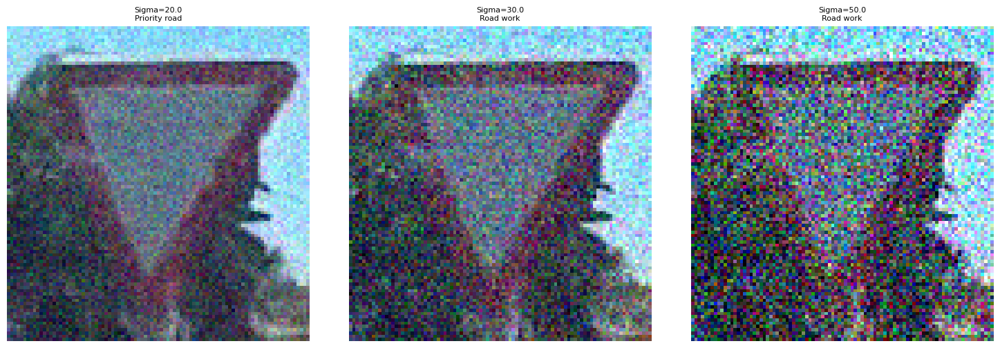

In [ ]:
show_images(cedas_adversario_teorico[0],cedas_adversario_teorico[1],cedas_adversario_teorico[2])

##### Máximo a 100 km/h

In [ ]:
limites_100_teorico = process_images_with_noise(df_resultados_teoria[df_resultados_teoria['Etiqueta real'] == 'Speed limit (100km/h)'],maximo100)

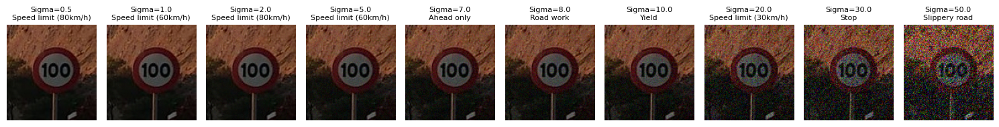

In [ ]:
show_images(limites_100_teorico[0],limites_100_teorico[1],limites_100_teorico[2])

##### Máximo a 70 km/h

In [ ]:
limites_70_teorico = process_images_with_noise(df_resultados_teoria[df_resultados_teoria['Etiqueta real'] == 'Speed limit (70km/h)'],maximo70)

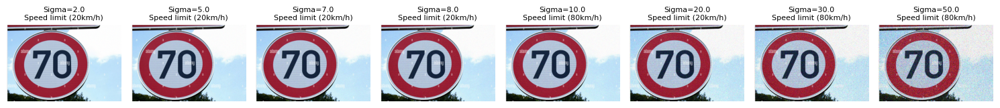

In [ ]:
show_images(limites_70_teorico[0],limites_70_teorico[1],limites_70_teorico[2])

##### Dirección prohibida

In [ ]:
dir_prohibida_teorico = process_images_with_noise(df_resultados_teoria[df_resultados_teoria['Etiqueta real'] == 'No passing'],direc_prohibida)

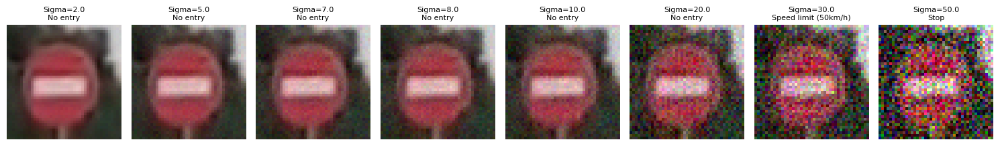

In [ ]:
show_images(dir_prohibida_teorico[0],dir_prohibida_teorico[1],dir_prohibida_teorico[2])

##### Máximo a 20 km/h

In [ ]:
limites_20_teorico = process_images_with_noise(df_resultados_teoria[df_resultados_teoria['Etiqueta real'] == 'Speed limit (20km/h)'],maximo20)

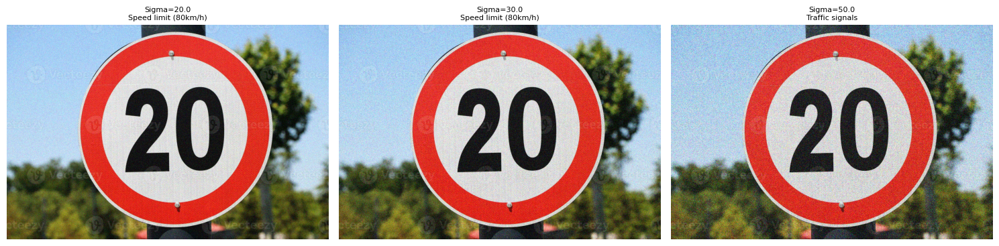

In [ ]:
show_images(limites_20_teorico[0],limites_20_teorico[1],limites_20_teorico[2])

Obsérvese que, en función de la imagen, el valor de la varianza mínimo necesario para que el clasificador falle varía en función de cuál sea la imagen. Además, mientras hay imágenes en las que el ruido se nota levemente, en otras hay que hacer una observación profunda para notar su existencia.

A continuación se muestra un resumen donde se esponen todos los casos, no apareciendo la imagen si el clasificador, para tal varianza, no ha sido engañado.

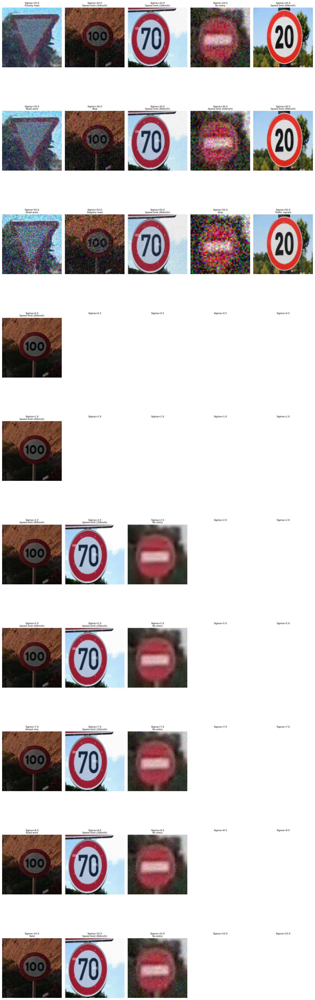

In [ ]:
show_images_by_sigma_grouped([cedas_adversario_teorico[0],limites_100_teorico[0],limites_70_teorico[0],dir_prohibida_teorico[0],limites_20_teorico[0]],[cedas_adversario_teorico[1],limites_100_teorico[1],limites_70_teorico[1],dir_prohibida_teorico[1],limites_20_teorico[1]],[cedas_adversario_teorico[2],limites_100_teorico[2],limites_70_teorico[2],dir_prohibida_teorico[2],limites_20_teorico[2]])

####Ataque FGSM

Implementación del algoritmo que genera un ataque FGSM: se necesita el gradiente del modelo, luego es **caja blanca**. Además, es **no etiquetado** y, aunque dé buenos resultados, puede no ser útil en un ataque real.

In [12]:
# Definir la función de pérdida para la entropía cruzada categórica
loss_object = tf.keras.losses.CategoricalCrossentropy()

# Generar el patrón adversario para una imagen y una etiqueta dadas
def patron_adversario(imagen, etiqueta_real):
    # Iniciar una grabación de gradiente
    with tf.GradientTape() as tape:
        tape.watch(imagen)  # Vigilar los gradientes respecto a la imagen
        prediccion = model(imagen)  # Obtener la predicción del modelo
        etiqueta_one_hot = tf.one_hot([etiqueta_real], depth=43)  # Convertir la etiqueta a formato one-hot (43 clases)
        perdida = loss_object(etiqueta_one_hot, prediccion)  # Calcular la pérdida entre la predicción y la etiqueta real

    # Calcular el gradiente de la pérdida con respecto a la imagen
    gradiente = tape.gradient(perdida, imagen)

    # Devolver el signo del gradiente
    return tf.sign(gradiente)

# Aplicar el método FGSM (Fast Gradient Sign Method) para generar una imagen adversaria
def FGSM(imagen, etiqueta_real, epsilon):
    # Preprocesar la imagen para el modelo
    imagen_aux = preprocessing(imagen)
    imagen_aux = tf.convert_to_tensor(imagen_aux, dtype=tf.float32)
    imagen_aux = tf.reshape(imagen_aux, (1, 32, 32, 1))  # Asegurar la forma correcta para el modelo (batch_size, height, width, channels)

    # Estas dos líneas preparan la imagen original para la visualización adversaria
    imagen = cv2.resize(imagen, (32, 32))  # Redimensionar la imagen a 32x32 píxeles
    imagen = imagen / 255.0  # Normalizar la imagen entre 0 y 1
    imagen = tf.convert_to_tensor(imagen, dtype=tf.float32)
    imagen = tf.reshape(imagen, (1, 32, 32, 3))  # Asegurar la forma correcta para la imagen en color

    # Obtener el patrón adversario utilizando el signo del gradiente
    signo = patron_adversario(imagen_aux, etiqueta_real[1])
    signo_color = tf.repeat(signo, 3, axis=-1)  # Expandir el gradiente para aplicarlo a una imagen en color

    # Generar la imagen adversaria sumando el ruido FGSM
    imagen_adversaria = imagen + epsilon * signo_color
    imagen_adversaria_np = tf.clip_by_value(imagen_adversaria, 0, 1)  # Recortar los valores para mantenerlos en [0, 1]
    imagen_adversaria_np = imagen_adversaria.numpy().squeeze() * 255  # Quitar dimensiones adicionales y escalar a [0, 255]
    imagen_adversaria_np = imagen_adversaria_np.astype(np.uint8)  # Convertir a uint8 para visualización

    # Retornar la imagen adversaria y el signo del gradiente en formato uint8
    return [imagen_adversaria_np, signo_color.numpy().squeeze()]

Se va a aplicar FGSM para todas las imágenes anteriores y diferentes epsilons para ver el posible resultado, guardándolo para poder tratarlo más adelante

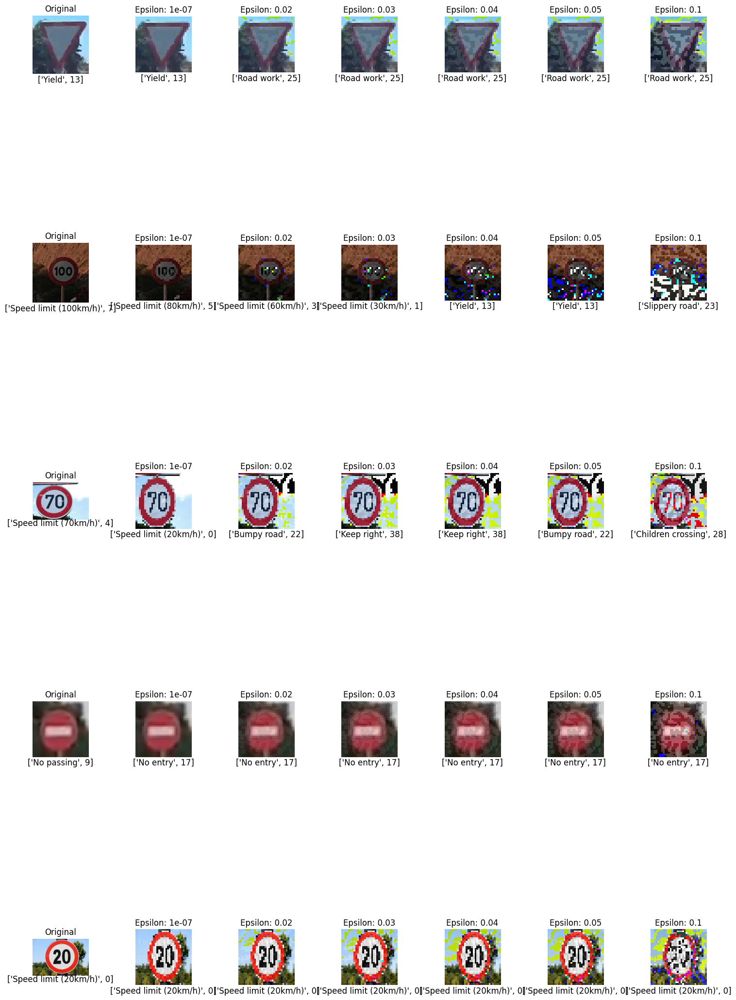

In [13]:
import pickle

epsilons = [0.0000001, 0.02, 0.03, 0.04, 0.05, 0.1]

# Lista para almacenar los resultados
results = []
etiquetas_adversarias = []
# Crear una figura para visualizar las imágenes
fig, axes = plt.subplots(len(imagenes), len(epsilons) + 1, figsize=(15, len(imagenes) * 5))

for i, (image, label) in enumerate(zip(imagenes, etiquetas)):
    # Mostrar la imagen original
    axes[i, 0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axes[i, 0].set_title('Original')
    axes[i, 0].axis('off')
    axes[i, 0].text(0.5, -0.1, str(label),
                    ha='center', va='center', transform=axes[i, 0].transAxes, fontsize=12)  # Clasificación debajo de la imagen original
    aux_adv = []
    for j, epsilon in enumerate(epsilons):
        # Calcular el signo del gradiente y FGSM
        datos = FGSM(image, label, epsilon)

        # Mostrar la imagen perturbada
        axes[i, j + 1].imshow(cv2.cvtColor(datos[0], cv2.COLOR_BGR2RGB))
        pred_aux = clasificacion(datos[0])
        axes[i, j + 1].set_title(f'Epsilon: {epsilon}')
        axes[i, j + 1].axis('off')
        axes[i, j + 1].text(0.5, -0.1, f'{pred_aux}',
                            ha='center', va='center', transform=axes[i, j + 1].transAxes, fontsize=12)  # Clasificación debajo de la imagen perturbada

        # Almacenar los resultados en la lista
        results.append({
            'real_label': label,
            'predicted_label': pred_aux,
            'epsilon': epsilon,
            'gradient_sign': pickle.dumps(datos[1])  # Serializar con pickle
        })
        aux_adv.append(pred_aux)

    etiquetas_adversarias.append(aux_adv)

# Ajustar el layout de la figura
plt.tight_layout()
plt.show()

####Búsqueda local adversaria

Se toma como referencia la mostrada en la memoria del TFG: tomar como función objetivo la probabilidad de que la red clasifique con la etiqueta correcta y aplicar búsqueda local para minimizar la función objetivo. *Mi propuesta*: Dada la imagen $I$ con etiqueta real $c$, quiero que $f$ la clasifique como $c'$, tenemos:

- $g$: La función objetivo es la probabilidad de que $f$ clasifique una imagen como $c'$.

- Algoritmo: Búsqueda local para maximizar $g$.

En resumen, el enfoque del artículo es no etiquetado. El que propongo es etiquetado (más interesante pero puede que se note más la manipulación de la imagen).

**Condición**: Preprocesar la imagen para tratarla en blanco y negro. Prefijar la etiqueta que quiero. Para este ejercicio solo se fijará la etiqueta de "máximo 20" y se pasarán las imágenes máximo a 70 y dirección prohibida (es más real la primera, por compartir similitudes, y en un vehículo autónomo provocar un accidente).

In [17]:
# Definir el índice de la etiqueta objetivo
index_objective_label = 0  # Máximo valor permitido es 20

# Función para calcular la probabilidad de la etiqueta objetivo para una imagen dada
# Se supone que 'imagen' es el resultado del preprocesamiento
def funcionObjetivo(imagen):
    # Copiar y preprocesar la imagen para asegurarse de que esté en la forma correcta
    aux = preprocessing(imagen).copy()

    # Redimensionar la imagen para que tenga la forma esperada por el modelo
    aux = aux.reshape(1, 32, 32, 1)  # (batch_size, height, width, channels)

    # Suprimir la salida estándar y la salida de error durante la predicción
    with suppress_stdout_stderr():
        # Obtener la predicción del modelo para la imagen
        prediccion = model.predict(aux)

    # Retornar la probabilidad de la etiqueta objetivo
    return prediccion[0][index_objective_label]


Usando la función objetivo antes definida, se implementa búsqueda local dada una imagen para maximizar la función.

In [ ]:
import random
from PIL import Image

# Función para inicializar y mezclar una lista de índices
def mezclarIndices(n_elems, indexes, inicializar):
    if inicializar:
        # Inicializar la lista de índices de 0 a n_elems - 1
        for i in range(0, n_elems):
            indexes.append(i)
    # Mezclar los índices aleatoriamente
    random.shuffle(indexes)

# Función para aplicar mutación local en un área de la imagen
def mutacionBL(imagen_array, centro, altura_mitad=10, longitud_mitad=10, media=0, desviacion_estandar=10):
    # Obtener las dimensiones de la imagen
    h, w, c = imagen_array.shape
    x, y = centro

    # Calcular los límites del área donde se aplicará la mutación
    x_min = max(0, x - altura_mitad)
    x_max = min(h, x + altura_mitad)
    y_min = max(0, y - longitud_mitad)
    y_max = min(w, y + longitud_mitad)

    # Generar ruido gaussiano para el área especificada
    ruido = np.random.normal(loc=media, scale=desviacion_estandar, size=(x_max - x_min, y_max - y_min, c))

    # Aplicar el ruido a la imagen y recortar los valores para mantenerlos entre 0 y 255
    imagen_array[x_min:x_max, y_min:y_max, :] = np.clip(imagen_array[x_min:x_max, y_min:y_max, :] + ruido, 0, 255).astype(np.uint8)

    return imagen_array

# Función para realizar búsqueda local en la imagen para mejorar la función objetivo
def busqueda_local(imagen):
    # Crear una solución inicial y calcular su valor de función objetivo
    solucion = [np.array(imagen.copy()), funcionObjetivo(imagen.copy())]

    max_iteraciones = 2000  # Número máximo de iteraciones permitidas
    num_iter = 1  # Contador de iteraciones
    n_vecinos_generados_sin_mejora = 0  # Contador de vecinos generados sin mejora
    hubo_mejora = True  # Indicador de si hubo una mejora en la iteración actual
    n_elementos_imagen = solucion[0].shape[0] * solucion[0].shape[1]  # Número de elementos en la imagen
    indexes = []  # Lista para almacenar los índices
    mezclarIndices(n_elementos_imagen, indexes, True)  # Inicializar y mezclar los índices

    # Lista para registrar el valor de la función objetivo en cada iteración
    valores_funcion_objetivo = [solucion[1]]

    # Bucle principal de búsqueda local
    while hubo_mejora and num_iter <= max_iteraciones and n_vecinos_generados_sin_mejora < 20 * n_elementos_imagen:
        hubo_mejora = False
        j = 0

        # Iterar sobre los índices para generar vecinos
        while j < len(indexes) and not hubo_mejora:
            vecino = solucion[0].copy()  # Copiar la solución actual para crear un vecino
            index_2d = (indexes[j] // solucion[0].shape[1], indexes[j] % solucion[0].shape[1])  # Convertir el índice 1D a 2D
            mutacionBL(vecino, index_2d)  # Aplicar mutación local al vecino

            fitness_vecino = funcionObjetivo(vecino)  # Calcular el valor de la función objetivo del vecino

            num_iter += 1  # Incrementar el contador de iteraciones

            # Si el vecino tiene una mejor función objetivo, actualizar la solución
            if fitness_vecino > solucion[1]:
                solucion[0] = vecino
                solucion[1] = fitness_vecino
                hubo_mejora = True
                valores_funcion_objetivo.append(fitness_vecino)  # Registrar el valor de la función objetivo
            else:
                n_vecinos_generados_sin_mejora += 1

            j += 1

        # Si hubo mejora, reiniciar el contador de vecinos sin mejora y volver a mezclar los índices
        if hubo_mejora:
            n_vecinos_generados_sin_mejora = 0
            mezclarIndices(n_elementos_imagen, indexes, False)

    # Graficar el valor de la función objetivo a lo largo de las iteraciones
    plt.figure(figsize=(10, 6))
    plt.plot(valores_funcion_objetivo, label='Valor de la función objetivo')
    plt.xlabel('Iteraciones')
    plt.ylabel('Valor de la función objetivo')
    plt.title('Convergencia de la búsqueda local')
    plt.legend()
    plt.grid(True)
    plt.show()

    # Retornar la mejor solución encontrada
    return solucion

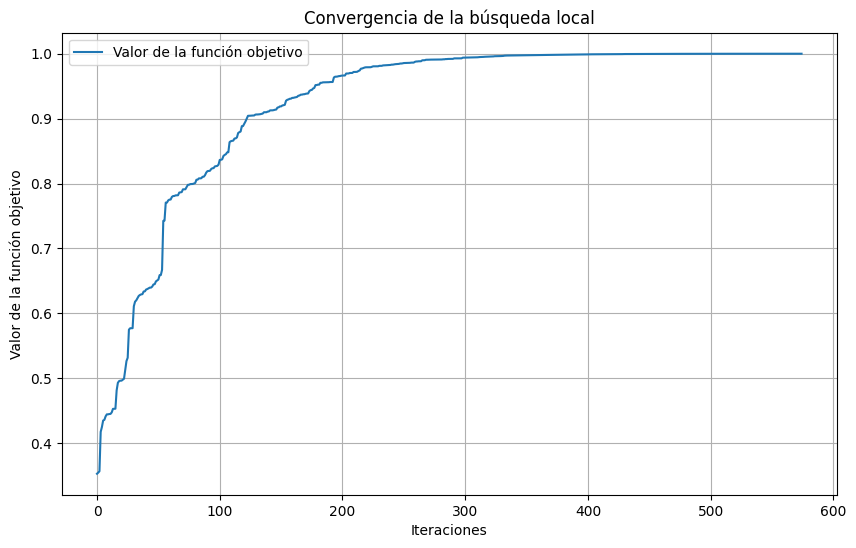

In [ ]:
maximo70_adversario = busqueda_local(maximo70)

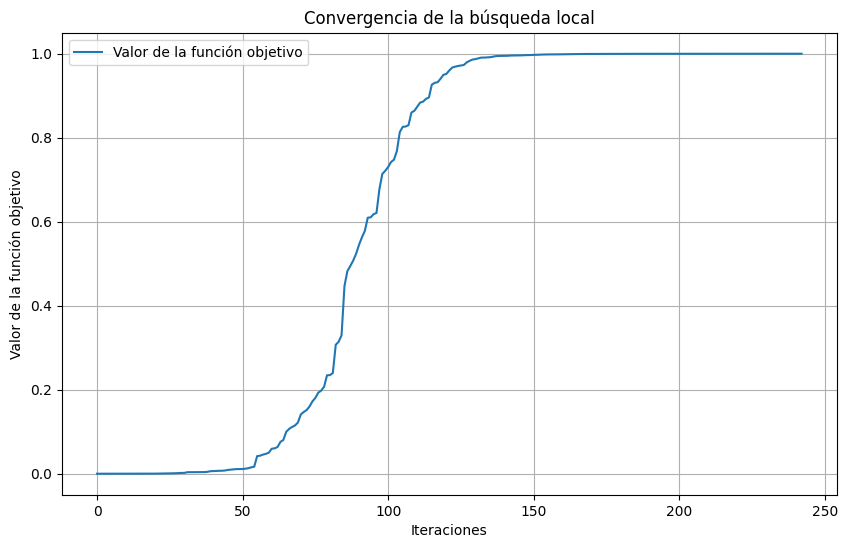

In [ ]:
direc_prohibida_adversario = busqueda_local(direc_prohibida)

In [ ]:
etiq_bl_maximo70 = clasificacion(maximo70_adversario[0])
etiq_dir_prob_adversario = clasificacion(direc_prohibida_adversario[0])

In [ ]:
print("La imagen de máximo a 70 adversario clasifica como "+str(etiq_bl_maximo70[0])+" con probabilidad "+str(maximo70_adversario[1]))
print("La imagen de máximo a 70 adversario clasifica como "+str(etiq_dir_prob_adversario[0])+" con probabilidad "+str(direc_prohibida_adversario[1]))

La imagen de máximo a 70 adversario clasifica como Speed limit (20km/h) con probabilidad 0.9999944
La imagen de máximo a 70 adversario clasifica como Speed limit (20km/h) con probabilidad 0.999997


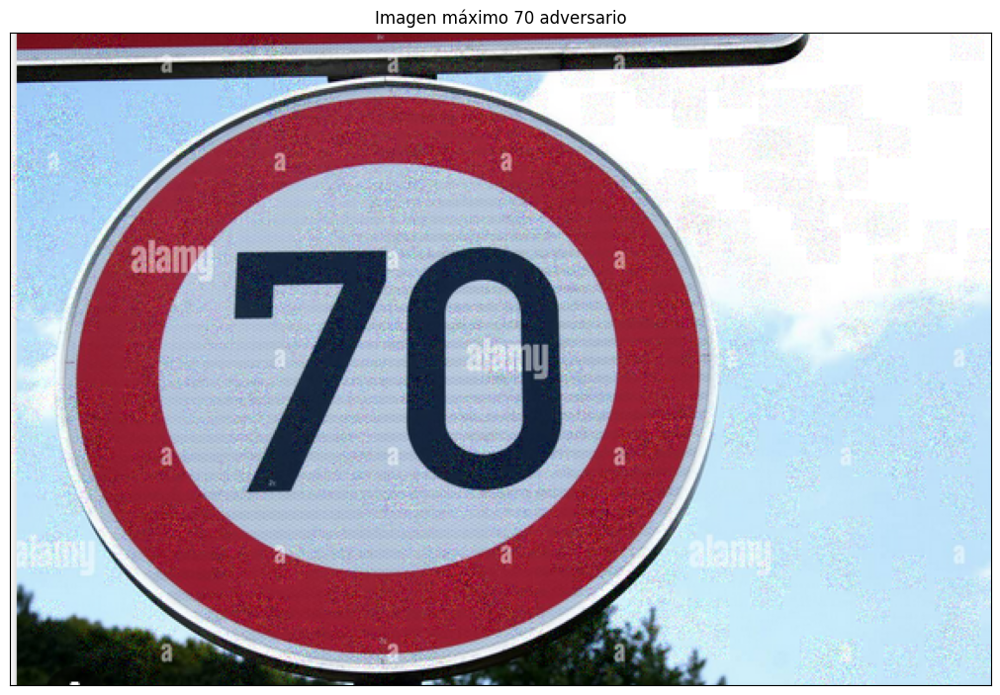

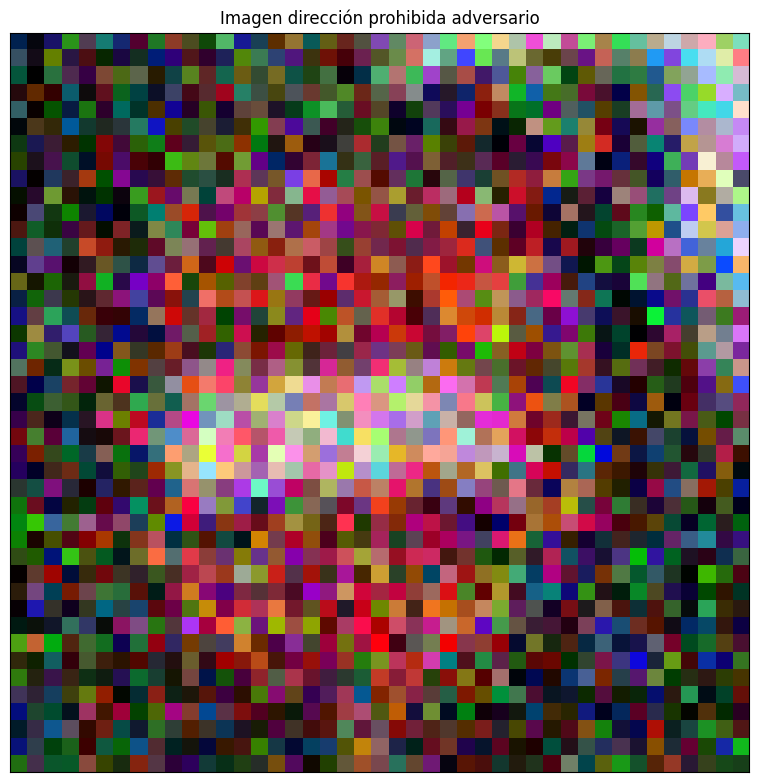

In [ ]:
displayIm(maximo70_adversario[0],'Imagen máximo 70 adversario')
displayIm(direc_prohibida_adversario[0],'Imagen dirección prohibida adversario')

In [ ]:
data_m70 = {
    "Etiqueta real": [etiquetas[2][0]],
    "Etiqueta adversaria": [etiq_bl_maximo70[0]],
    "Probabilidad de pertenencia a clase adversaria": [maximo70_adversario[1]],
    "Imagen adversaria": [maximo70_adversario[0]]
}

df1 = pd.DataFrame(data_m70)

data_dir_prob = {
    "Etiqueta real": [etiquetas[3][0]],
    "Etiqueta adversaria": [etiq_dir_prob_adversario[0]],
    "Probabilidad de pertenencia a clase adversaria": [direc_prohibida_adversario[1]],
    "Imagen adversaria": [direc_prohibida_adversario[0]]
}

df2 = pd.DataFrame(data_dir_prob)

df_combined = pd.concat([df1,df2],ignore_index=True)

df_combined.to_csv("/content/drive/My Drive/Colab Notebooks/TFG/CNN_senales_trafico/Resultados/resultados_BL_propuesto.csv",index=False)
print("Datos guardados con éxito")

Datos guardados con éxito
